<h2>Converting video stream to images</h2>

Reused code from this guide https://medium.com/@iKhushPatel/convert-video-to-images-images-to-video-using-opencv-python-db27a128a481

In [23]:
import cv2
%pylab inline
from PIL import Image 

Populating the interactive namespace from numpy and matplotlib


In [24]:
def getFrame(secm, video_name):
    vidcap.set(cv2.CAP_PROP_POS_MSEC,sec*1000)
    hasFrames,image = vidcap.read()
    #if hasFrames:
        #cv2.imwrite(video_name +"_image_"+str(count)+".jpg", image) 
        # save frame as JPG file
    return hasFrames, image

<h3>You must have the video file in the same folder before running this script</h3>

Raw video files can be downloaded here: https://drive.google.com/drive/folders/1l3s8cd9VFk88rqp3Ly2iEiE2dPWsmLEs?usp=sharing

In [25]:
#Type the names of the file in here
video_files = ['Video_Stream.mp4']
width = 256
height = 256
dim = (width, height)
count_generated_files = []

for video in video_files:
    vidcap = cv2.VideoCapture(video)
    sec = 0
    frameRate = 10 #//Change the number of seconds per interval here
    count=0
    test_images = []
    hasFrames, image = getFrame(sec, video)
    while hasFrames:
        count = count + 1
        sec = sec + frameRate
        sec = round(sec, 2)
        image =  cv2.resize(image, dim, interpolation = cv2.INTER_AREA)
        test_images.append(np.asarray(image))
        hasFrames, image = getFrame(sec, video)
    count_generated_files.append(count)

print(count_generated_files, " frames from each video")

[106]  frames from each video


<h2>Display some sample images from the video stream</h2>

In [26]:
test_images = np.array(test_images)

In [47]:
import torch
import torchvision

In [50]:
test_images_tensor = torch.tensor(test_images)

AttributeError: 'Tensor' object has no attribute 'Normalize'

In [44]:
from fastai.vision import *

In [48]:
transform = torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])

In [49]:
transform(test_images_tensor)

TypeError: tensor is not a torch image.

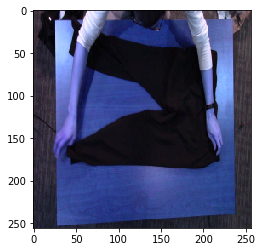

In [40]:
imshow(test_images_tensor.numpy()[15])

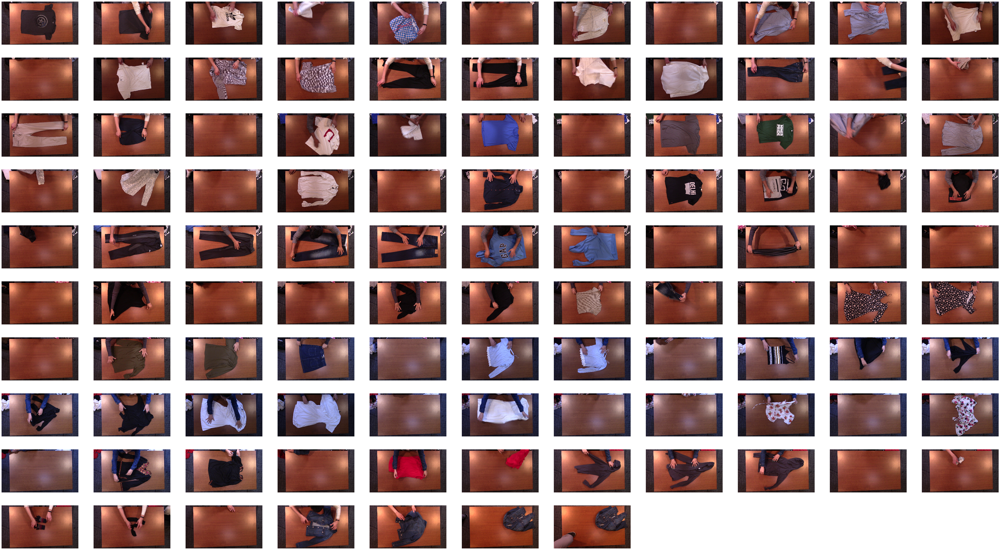

In [10]:
#for i in range(len(video_files)):
  #  fig = figure(0, (80, 50))
   # for k in range(count_generated_files[i]):
   #     fig.add_subplot(1,1, k+1)
   #     cropped_image = Image.open(video_files[i] +"_image_"+str(k)+".jpg")
     #   test_images.append(np.asarray(cropped_image))
      #  imshow(cropped_image)
      #  axis('off')